In [1]:
from torch.utils.data import DataLoader, Dataset
import os
from time import time
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import random
from sklearn.model_selection import train_test_split
import albumentations as albu
from torch.utils.data.sampler import WeightedRandomSampler
from torchsampler import ImbalancedDatasetSampler
from albumentations.pytorch import ToTensor
import segmentation_models_pytorch as smp
import numpy as np
import cv2
from matplotlib import pyplot as plt

In [2]:
BATCH_SIZE = 4
num_workers = 0
MEAN = (0.485, 0.456, 0.406)
STD = (0.229, 0.224, 0.225)
ENCODER = 'resnet34'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid'
DEVICE = 'cuda'
loss_type = 'combined_loss' # Bce, Dice, BCEDiceContrastiveloss, or other
des = '2C_0804_1'# 
folder = 'D:/WDD/20200723/'

In [3]:
# heavy
# https://github.com/qubvel/segmentation_models.pytorch/blob/master/examples/cars%20segmentation%20(camvid).ipynb
train_transform = albu.Compose([
    #albu.Resize(1024, 1024), 
    
    #albu.ShiftScaleRotate(scale_limit=0.4, rotate_limit=0, shift_limit=0.1, p=0.5, border_mode=0),
    #albu.HorizontalFlip(p=0.5),
    #albu.VerticalFlip(p=0.5),
    
    albu.OneOf(
            [
                albu.CLAHE(p=1),
                albu.RandomBrightness(p=1),
                #albu.RandomGamma(p=1),
            ],
            p=0.5,
        ),

    albu.OneOf(
        [
            albu.RandomContrast(p=1),
            #albu.HueSaturationValue(p=1),
        ],
        p=0.5,
    ),
    
    #albu.Normalize(mean=MEAN, std=STD),
    ToTensor()
])

val_transform = albu.Compose([
    #albu.Resize(1024, 1024), 
    #albu.Normalize(mean=MEAN, std=STD),
    ToTensor()
])

In [4]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        #plt.xticks([])
        #plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.savefig('viz.png')
    plt.show()

In [5]:
class WDDDataset(Dataset):
    def __init__(self, data_lst, pth, train=True, transform=None):
        self.data_lst = data_lst
        self.pth = pth
        with open(pth+data_lst, 'r') as f:
            files = f.read().splitlines()
        self.files = files
        self.transform = transform
        self.train = train
        #print(self.converted)

    def __getitem__(self, idx):
        image_id = self.files[idx]#.split('.')[0]
        #print(image_id)
        img_pth = os.path.join(self.pth, 'images', image_id)
        #print(img_pth)
        img = cv2.imread(img_pth)
        #print(img.shape)
        cur_img = img[:,:,0]
        his_img = img[:,:,1]
        #cur_img = cv2.cvtColor(cur_img, cv2.COLOR_GRAY2RGB)
        #his_img = cv2.cvtColor(his_img, cv2.COLOR_GRAY2RGB)
        cur_img = np.expand_dims(cur_img, 2)
        his_img = np.expand_dims(his_img, 2)
        #print(cur_img.shape)
        
        mask_pth = img_pth.replace('.bmp', '_.bmp')
        if os.path.exists(mask_pth):
            mask = cv2.imread(mask_pth, 0)
            mask[mask < 255] = 0
            mask = mask / 255
        else:
            mask = np.zeros((1024, 1024))
            
#         if self.train:
#             p = random.random()
#             if p > 0.5:
#             # flip, 
#             # 0, for flipping the image around the x-axis (vertical flipping);
#             # > 0 for flipping around the y-axis (horizontal flipping);
#             # < 0 for flipping around both axes.
#                 t = random.choice([-1, 0, 1])
#                 img_curr = cv2.flip(img_curr, t)
#                 img_hist = cv2.flip(img_hist, t)
#                 mask = cv2.flip(mask, t)
                
        if self.transform:
            augmented = self.transform(image=cur_img)
            img_curr = augmented['image']
            augmented = self.transform(image=his_img)
            img_hist = augmented['image']
        #print(img.shape, mask.shape)
        
        mask = torch.from_numpy(mask).unsqueeze(0)
        img = torch.cat((img_curr, img_hist))
        #print(img_curr.shape, img_hist.shape)
        #print(mask.shape)
        
       
        
        
        if self.train:
            p = random.random()
            if p > 0.5:
                img = torch.cat((img_hist, img_curr))
                
            return img, [mask, mask.max()]
        else:
            return img, [mask, mask.max()]

    def __len__(self):
        return len(self.files)

In [6]:
def callback_get_label(dataset, idx):
    return int(dataset[idx][1][1])

In [7]:
# weighted sample
train_lst = 'train1.txt'
val_lst = 'valid1.txt'
train_set = WDDDataset(train_lst, folder, True, train_transform)
valid_set = WDDDataset(val_lst, folder, False, val_transform)

# # WeightedRandomSampler
# target = torch.tensor([0 if mask[1]==0 else 1 for i, (img, mask) in enumerate(train_set)])
# print('target train 0/1: {}/{}'.format(
#     (target == 0).sum(), (target == 1).sum()))
# # Compute samples weight (each sample should get its own weight)
# class_sample_count = torch.tensor(
#     [(target == t).sum() for t in torch.unique(target, sorted=True)])
# weight = 1. / class_sample_count.float()
# samples_weight = torch.tensor([weight[t] for t in target])

# # Create sampler, dataset, loader
# sampler = WeightedRandomSampler(samples_weight, len(samples_weight))


# Imbalanced Dataset Sampler: https://github.com/ufoym/imbalanced-dataset-sampler
sampler = ImbalancedDatasetSampler(dataset=train_set, callback_get_label=callback_get_label)


train_loader = DataLoader(train_set, batch_size=BATCH_SIZE, num_workers=num_workers, sampler=sampler)
valid_loader = DataLoader(valid_set, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)

In [ ]:
for i, (imgs, masks) in enumerate(train_loader):
    t = masks[1].tolist()
    a = t.count(1)
    b = t.count(0)
    print(a,b)
    if i == 20:
        break

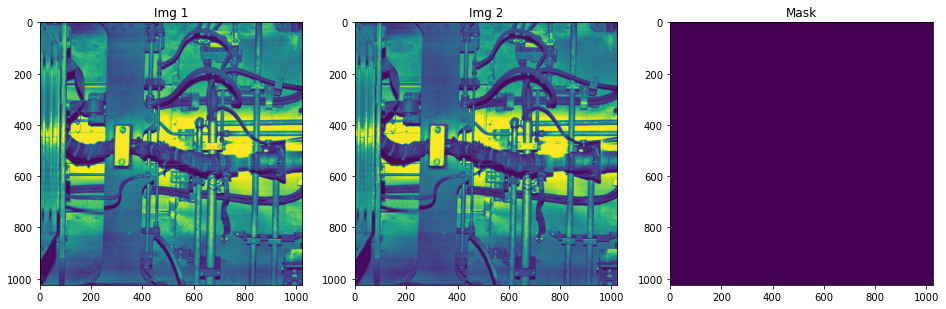

In [9]:
imgs, masks= train_set[121]
img_curr = imgs[0,:,:]
img_hist = imgs[1,:,:]
mask = masks[0]

visualize(
    img_1=img_curr, 
    img_2=img_hist, 
    mask=mask.squeeze(),
)

In [10]:
aux_params=dict(
    pooling='avg',             # one of 'avg', 'max'
    dropout=0.5,               # dropout ratio, default is None
    activation='sigmoid',      # activation function, default is None
    classes=2,                 # define number of output labels
)

In [11]:
model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=1, 
    in_channels=2,
    activation=ACTIVATION,
    aux_params=aux_params
)

In [12]:
#PyTorch
ALPHA = 0.5
BETA = 0.5

class TverskyLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(TverskyLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1, alpha=ALPHA, beta=BETA):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #True Positives, False Positives & False Negatives
        TP = (inputs * targets).sum()    
        FP = ((1-targets) * inputs).sum()
        FN = (targets * (1-inputs)).sum()
       
        Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  
        
        return 1 - Tversky

In [13]:
# https://github.com/ultralytics/yolov5/blob/master/utils/general.py#L426
class BCEBlurWithLogitsLoss(nn.Module):
    # BCEwithLogitLoss() with reduced missing label effects.
    def __init__(self, alpha=0.05):
        super(BCEBlurWithLogitsLoss, self).__init__()
        self.loss_fcn = smp.utils.losses.BCEWithLogitsLoss() #nn.BCEWithLogitsLoss(reduction='none')  # must be nn.BCEWithLogitsLoss()
        self.alpha = alpha

    def forward(self, pred, true):
        loss = self.loss_fcn(pred, true)
        print(loss.shape)
        pred = torch.sigmoid(pred)  # prob from logits
        #dx = pred - true  # reduce only missing label effects
        dx = (pred - true).abs()  # reduce missing label and false label effects
        alpha_factor = 1 - torch.exp((dx - 1) / (self.alpha + 1e-4))
        print(alpha_factor.shape)
        loss *= alpha_factor
        return loss.mean()
BCEB = BCEBlurWithLogitsLoss()

In [14]:
class FocalLoss(smp.utils.base.Loss):
    # FocalLoss usig BCEBlurWithLogitsLoss
    def __init__(self, alpha=1, gamma=2, logits=True, reduce=True, name='Focal'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.logits = logits
        self.reduce = reduce
        self.esp = 0.05

    def forward(self, inputs, targets):
        # apply label smoothing # https://www.zhihu.com/question/65339831/answer/685312120
        # print(f'target shape:{targets.shape}')  # torch.Size([4, 1, 1024, 1024])
        targets = (1 - self.esp) * targets + (1 - targets) * self.esp
        if self.logits:
            BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduce=False)
        else:
            BCE_loss = F.binary_cross_entropy(inputs, targets, reduce=False)
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduce:
            return torch.mean(F_loss)
        else:
            return F_loss
#focal = FocalLoss()

In [15]:
class BCEDice(smp.utils.base.Loss):
    def __init__(self, weights=[1, 0.7], name='BCEDice'):
        super().__init__()
        self.name = name
        self.weights = weights
        self.focal = FocalLoss() # FocalLoss()
        self.dice_loss = smp.utils.losses.DiceLoss()
        
    def forward(self, y_pr, y_gt):
        #print(y_pr.shape)
        #print(y_gt.shape)
        loss = self.weights[0] * self.focal(y_pr, y_gt) + self.weights[1] * self.dice_loss(y_pr, y_gt)
        return loss

In [16]:
class combinedLoss(smp.utils.base.Loss):
    def __init__(self, weights=[1, 1], name='combinedLoss'):
        super().__init__()
        self.name = name
        self.weights = weights
        self.bcedice = BCEDice()
        #self.ContrLoss = ContrastiveLoss()
        self.cls_head = smp.utils.losses.CrossEntropyLoss()
        
    def forward(self, inpt, y_gt):
        mask_pr, label_pr = inpt[0], inpt[1]
        mask_gt, label_gt = y_gt[0], y_gt[1]
#         print('mask_pr',mask_pr.shape)
#         print('mask_gt',mask_gt.shape)
        loss_bcedice = self.bcedice(mask_pr, mask_gt)
        #loss_contr = self.ContrLoss(f1[0], f2[0], label_gt)
        #print('label_pr', label_pr.shape)
        #print('label_gt', label_gt.shape)
        #print(label_pr.dtype)
        #print(label_gt.dtype)
        loss_cls = self.cls_head(label_pr, label_gt.long())
        return loss_bcedice + loss_cls * 0.6
    
cLoss = combinedLoss()

In [17]:
if loss_type == 'Bce':
    loss = smp.utils.losses.BCEWithLogitsLoss()
    loss_key = 'bce_with_logits_loss'
elif loss_type == 'Dice':
    loss = smp.utils.losses.DiceLoss()
    loss_key = 'dice_loss'
elif loss_type == 'BCEDice':
    loss = BCEDice()
    loss_key = 'BCEDice'
else:
    loss = cLoss
    loss_key = 'combined_loss'
    
#loss = smp.utils.losses.DiceLoss() #smp.utils.losses.BCEWithLogitsLoss() # smp.utils.losses.BCEWithLogitsLoss() # smp.utils.losses.DiceLoss()

In [18]:
loss

combinedLoss(
  (bcedice): BCEDice(
    (focal): FocalLoss()
    (dice_loss): DiceLoss(
      (activation): Activation(
        (activation): Identity()
      )
    )
  )
  (cls_head): CrossEntropyLoss()
)

In [19]:
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [20]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [21]:
def savelogs(logs, name):
    with open(f'{name}.txt', 'a') as f:
        for k, v in logs.items():
            f.write(f'{k} {v}')
        f.write('\n')

In [ ]:
max_score = 1e5
losses = {}
ious = {}
losses['train'] = []
losses['valid'] = []
ious['train'] = []
ious['valid'] = []

for i in range(0, 120):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    savelogs(train_logs, f'./logs/train_logs_{des}')
    savelogs(valid_logs, f'./logs/valid_logs_{des}')
    
    losses['train'].append(train_logs[loss_key])
    losses['valid'].append(valid_logs[loss_key])
    ious['train'].append(train_logs['iou_score'])
    ious['valid'].append(valid_logs['iou_score'])
    #break
    # do something (save model, change lr, etc.)
    # val loss
    if max_score > valid_logs['combined_loss']:
        max_score = valid_logs['combined_loss']
        torch.save(model, f'./logs/{des}.pth')
        print('Model saved!')
        
    if i == 35:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!')
    
    if i == 65:
        optimizer.param_groups[0]['lr'] = 1e-6
        print('Decrease decoder learning rate to 1e-6!')
    
    if i == 95:
        optimizer.param_groups[0]['lr'] = 1e-7
        print('Decrease decoder learning rate to 1e-7!')

In [23]:
train_logs

{'combined_loss': 0.4790149580344578, 'iou_score': 0.7660826760018095}

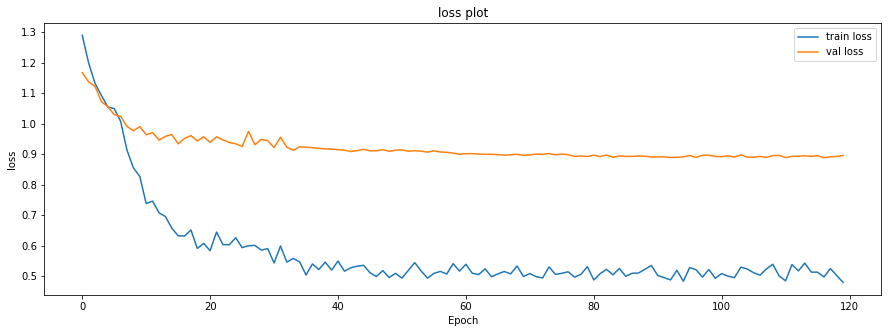

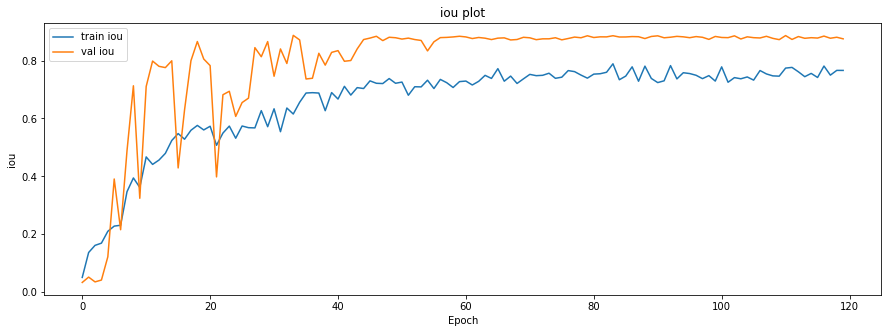

In [24]:
# PLOT TRAINING

def plot(scores, name):
    plt.figure(figsize=(15,5))
    plt.plot(range(len(scores["train"])), scores["train"], label=f'train {name}')
    plt.plot(range(len(scores["train"])), scores["valid"], label=f'val {name}')
    plt.title(f'{name} plot'); plt.xlabel('Epoch'); plt.ylabel(f'{name}');
    plt.legend(); 
    plt.show()

plot(losses, "loss")
plot(ious, "iou")

In [25]:
best_model = torch.load(f'./logs/{des}.pth')

In [26]:
des

'2C_0804_1'

In [27]:
# create test dataset
test_dataset = valid_set

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE)

In [28]:
%%time
# evaluate model on test set
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_dataloader)

valid: 100%|██████████| 22/22 [00:04<00:00,  4.99it/s, combined_loss - 0.8879, iou_score - 0.8847]
Wall time: 4.42 s


In [29]:
# focal loss: 0.9078 

In [30]:
# test dataset without transformations for image visualization
test_dataset_vis = WDDDataset(val_lst, folder, False, val_transform)

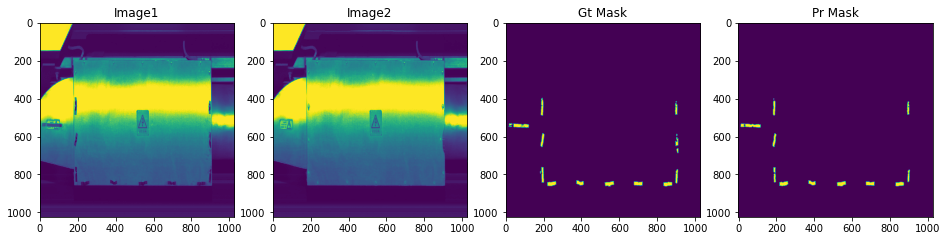

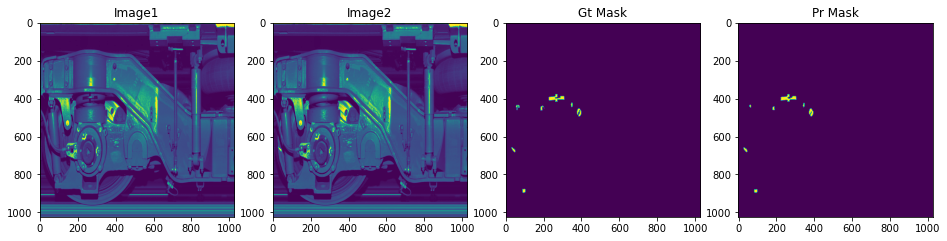

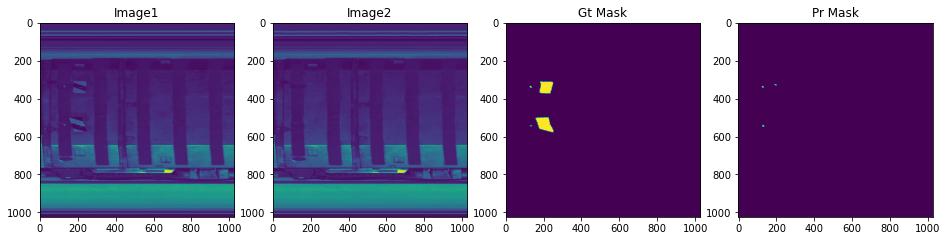

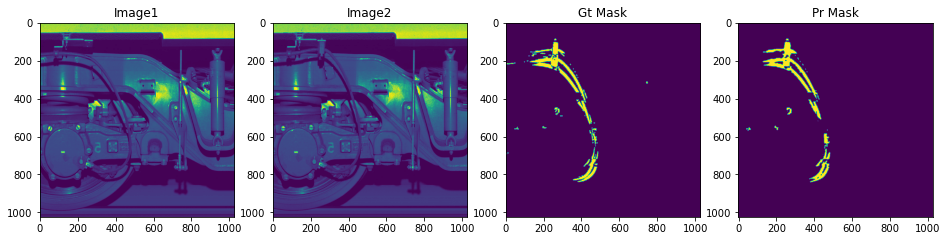

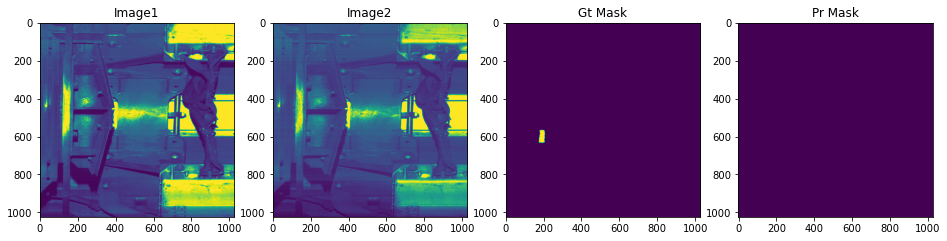

...

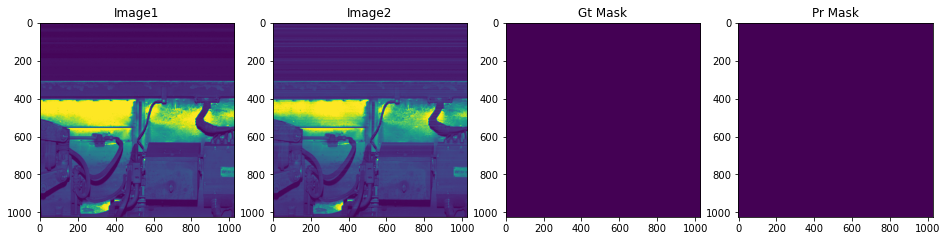

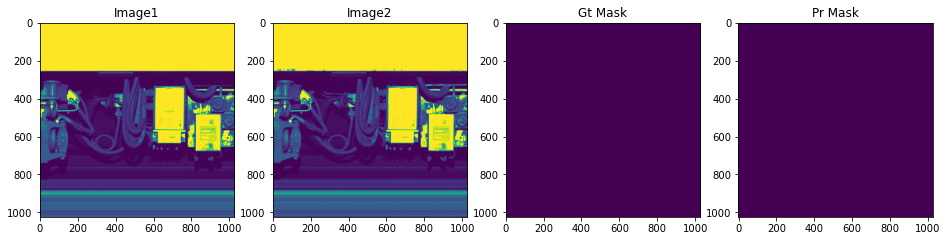

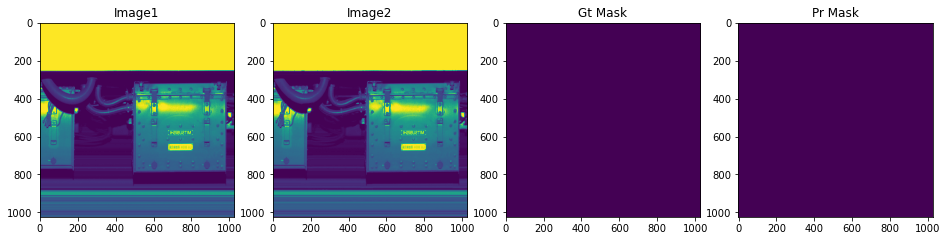

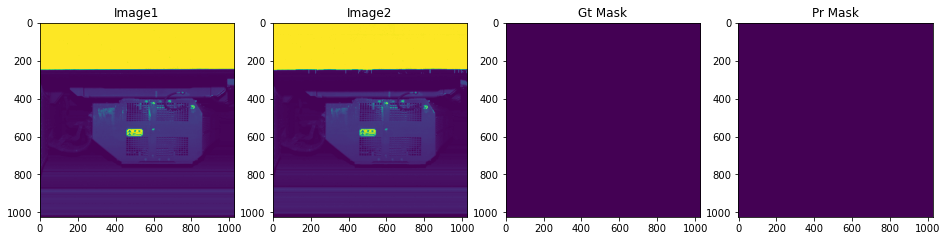

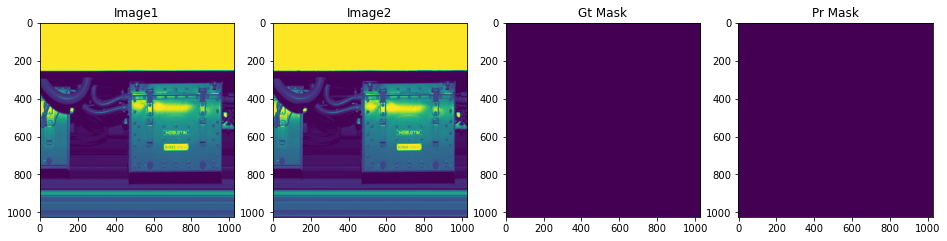

In [31]:
best_model.eval()
for i in range(len(test_dataset)):
    #n = np.random.choice(len(test_dataset))
    n = i
    image1_vis, image2_vis = test_dataset_vis[n][0]
    images, gt_mask = test_dataset[n]
    
    gt_mask = gt_mask#.squeeze()
    
    #image = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model(images.unsqueeze(0).cuda())[0]
    pr_mask = (pr_mask.squeeze().cpu().detach().numpy().round())
        
    visualize(
        image1=image1_vis, 
        image2=image2_vis,
        gt_mask=gt_mask[0][0], 
        pr_mask=pr_mask,
    )